In [1]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from skimpy import skim
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix,recall_score,f1_score,precision_score

In [2]:
df_HCC = pd.read_csv("HCC.csv")

In [3]:
df_HCC.head()


,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,ALP,TP,Creatinine,Nodule,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
0,1,0,1,0,0,0,0,1,0,1,...,150,"7,1","0,7",1,"3,5","0,5","52,5",37,856,1
1,0,0,0,0,0,0,1,1,0,1,...,120,7,"0,58",1,"1,8","0,85",32,10,18,1
2,1,0,1,1,0,1,0,1,0,1,...,109,7,"2,1",5,13,"0,1",28,6,16,1
3,1,1,1,0,0,0,0,1,0,1,...,174,"8,1","1,11",2,"15,7","0,2",131,78,1316,0
4,1,1,1,1,0,1,0,1,0,1,...,109,"6,9","1,8",1,9,"0,1",59,15,22,1


In [4]:
### displaying the last 5 rows
df_HCC.tail()

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,ALP,TP,Creatinine,Nodule,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
199,0,0,0,0,0,0,1,1,0,0,...,117,7,"5,25",2,"8,8","1,35","73,3",46,873,0
200,0,1,1,0,0,0,0,1,0,0,...,231,"6,5","0,78",2,"7,6","1,04","69,3",23,70,0
201,1,1,1,0,0,0,0,1,0,0,...,304,7,"1,07",1,12,"1,57","71,2",29,106,0
202,1,1,1,0,0,0,0,1,0,0,...,197,"7,2","1,08",5,3,"0,63","94,4",83,859,0
203,0,1,0,0,0,0,0,0,0,0,...,579,"7,2","2,13",5,"16,1","0,11","14,6",5,161,0


In [5]:
## finding the shape
df_HCC.shape

(204, 50)

### summary of data

In [6]:
skim(df_HCC)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                                                                 │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                          │
│ ┃ dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃                                                          │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                          │
│ │ Number of rows    │ 204    │ │ int32       │ 34    │                                                          │
│ │ Number of columns │ 50     │ │ string      │ 16    │                                                          │
│ └───────────────────┴────────┘ └─────────────┴───────┘                                                          │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━━━━━━━━━━┳━━━━━┳━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━━┳━━━━━━━┳━━━━━━━━┓  │
│ ┃ column_name        ┃ NA  ┃ NA %   ┃ mean      ┃ sd       ┃ p0  ┃ p25    ┃ p50    ┃ p75    ┃ p100  ┃ hist   ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━╇━━━━━╇━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━━╇━━━━━━━╇━━━━━━━━┩  │
│ │ Gender             │   0 │      0 │    0.7941 │   0.4053 │   0 │      1 │      1 │      1 │     1 │ ▂    ▇ │  │
│ │ Symptoms           │   0 │      0 │    0.6912 │   0.4631 │   0 │      0 │      1 │      1 │     1 │ ▃    ▇ │  │
│ │ Alcohol            │   0 │      0 │    0.7206 │   0.4498 │   0 │      0 │      1 │      1 │     1 │ ▃    ▇ │  │
│ │ HBsAg              │   0 │      0 │   0.09314 │   0.2913 │   0 │      0 │      0 │      0 │     1 │ ▇    ▁ │  │
│ │ HBeAg              │   0 │      0 │   0.01471 │   0.1207 │   0 │      0 │      0 │      0 │     1 │   ▇    │  │
│ │ HBcAb              │   0 │      0 │    0.2598 │   0.4396 │   0 │      0 │      0 │      1 │     1 │ ▇    ▃ │  │
│ │ HCVAb              │   0 │      0 │    0.2059 │   0.4053 │   0 │      0 │      0 │      0 │     1 │ ▇    ▂ │  │
│ │ Cirrhosis          │   0 │      0 │    0.8971 │   0.3046 │   0 │      1 │      1 │      1 │     1 │ ▁    ▇ │  │
│ │ Endemic            │   0 │      0 │   0.05882 │   0.2359 │   0 │      0 │      0 │      0 │     1 │   ▇    │  │
│ │ Smoking            │   0 │      0 │     0.451 │   0.4988 │   0 │      0 │      0 │      1 │     1 │ ▇    ▇ │  │
│ │ Diabetes           │   0 │      0 │    0.3578 │   0.4805 │   0 │      0 │      0 │      1 │     1 │ ▇    ▅ │  │
│ │ Obesity            │   0 │      0 │    0.1078 │   0.3109 │   0 │      0 │      0 │      0 │     1 │ ▇    ▁ │  │
│ │ Hemochro           │   0 │      0 │   0.05392 │   0.2264 │   0 │      0 │      0 │      0 │     1 │   ▇    │  │
│ │ AHT                │   0 │      0 │    0.3676 │   0.4834 │   0 │      0 │      0 │      1 │     1 │ ▇    ▅ │  │
│ │ CRI                │   0 │      0 │    0.1422 │   0.3501 │   0 │      0 │      0 │      0 │     1 │ ▇    ▁ │  │
│ │ HIV                │   0 │      0 │   0.01471 │   0.1207 │   0 │      0 │      0 │      0 │     1 │   ▇    │  │
│ │ NASH               │   0 │      0 │   0.04902 │   0.2164 │   0 │      0 │      0 │      0 │     1 │   ▇    │  │
│ │ Varices            │   0 │      0 │    0.6324 │   0.4834 │   0 │      0 │      1 │      1 │     1 │ ▅    ▇ │  │
│ │ Spleno             │   0 │      0 │    0.5343 │      0.5 │   0 │      0 │      1 │      1 │     1 │ ▇    ▇ │  │
│ │ PHT                │   0 │      0 │    0.6814 │   0.4671 │   0 │      0 │      1 │      1 │     1 │ ▃    ▇ │  │
│ │ PVT                │   0 │      0 │    0.2206 │   0.4157 │   0 │      0 │      0 │      0 │     1 │ ▇    ▂ │  │
│ │ Metastasis         │   0 │      0 │      0.25 │   0.4341 │   0 │      0 │      0 │   0.25 │     1 │ ▇    ▃ │  │
│ │ Hallmark           │   0 │      0 │    0.6569 │   0.

## EDA (Exploratory Data Analysis)

In [7]:
### checking the columns
df_HCC.columns

Index(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'Age', 'Grams_day', 'Packs_year', 'PS',
       'Encephalopathy', 'Ascites', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', 'Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodule', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin', 'Class'],
      dtype='object')

In [8]:
### Checking the infromation
df_HCC.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 204 entries, 0 to 203
Data columns (total 50 columns):
 #   Column          Non-Null Count  Dtype 
---  ------          --------------  ----- 
 0   Gender          204 non-null    int64 
 1   Symptoms        204 non-null    int64 
 2   Alcohol         204 non-null    int64 
 3   HBsAg           204 non-null    int64 
 4   HBeAg           204 non-null    int64 
 5   HBcAb           204 non-null    int64 
 6   HCVAb           204 non-null    int64 
 7   Cirrhosis       204 non-null    int64 
 8   Endemic         204 non-null    int64 
 9   Smoking         204 non-null    int64 
 10  Diabetes        204 non-null    int64 
 11  Obesity         204 non-null    int64 
 12  Hemochro        204 non-null    int64 
 13  AHT             204 non-null    int64 
 14  CRI             204 non-null    int64 
 15  HIV             204 non-null    int64 
 16  NASH            204 non-null    int64 
 17  Varices         204 non-null    int64 
 18  Spleno    

In [9]:
### Null values
df_HCC.isnull().sum()

Gender            0
Symptoms          0
Alcohol           0
HBsAg             0
HBeAg             0
HBcAb             0
HCVAb             0
Cirrhosis         0
Endemic           0
Smoking           0
Diabetes          0
Obesity           0
Hemochro          0
AHT               0
CRI               0
HIV               0
NASH              0
Varices           0
Spleno            0
PHT               0
PVT               0
Metastasis        0
Hallmark          0
Age               0
Grams_day         0
Packs_year        0
PS                0
Encephalopathy    0
Ascites           0
INR               0
AFP               0
Hemoglobin        0
MCV               0
Leucocytes        0
Platelets         0
Albumin           0
Total_Bil         0
ALT               0
AST               0
GGT               0
ALP               0
TP                0
Creatinine        0
Nodule            0
Major_Dim         0
Dir_Bil           0
Iron              0
Sat               0
Ferritin          0
Class             0


In [10]:
## finding the statical information
df_HCC.describe().T

,count,mean,std,min,25%,50%,75%,max
Gender,204.0,0.794118,0.405340,0.0,1.00,1.0,1.00,1.0
Symptoms,204.0,0.691176,0.463145,0.0,0.00,1.0,1.00,1.0
Alcohol,204.0,0.720588,0.449814,0.0,0.00,1.0,1.00,1.0
HBsAg,204.0,0.093137,0.291340,0.0,0.00,0.0,0.00,1.0
HBeAg,204.0,0.014706,0.120669,0.0,0.00,0.0,0.00,1.0
HBcAb,204.0,0.259804,0.439606,0.0,0.00,0.0,1.00,1.0
HCVAb,204.0,0.205882,0.405340,0.0,0.00,0.0,0.00,1.0
Cirrhosis,204.0,0.897059,0.304630,0.0,1.00,1.0,1.00,1.0
Endemic,204.0,0.058824,0.235873,0.0,0.00,0.0,0.00,1.0
Smoking,204.0,0.450980,0.498815,0.0,0.00,0.0,1.00,1.0


In [11]:
##chekiing the values in the our target columns
df_HCC['Class'].value_counts()

Class
1    102
0    102
Name: count, dtype: int64

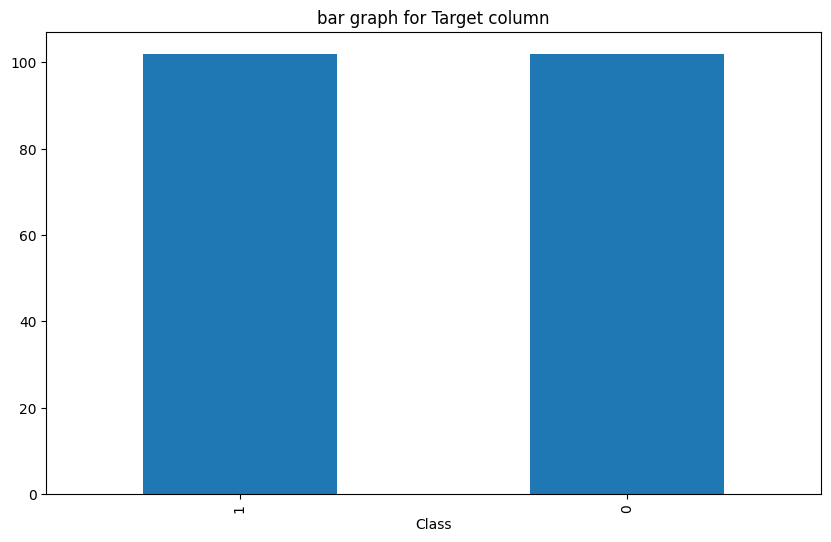

In [12]:
## plot for values in Target column
plt.figure(figsize=(10,6))
df_HCC['Class'].value_counts().plot(kind='bar',title="bar graph for Target column")
plt.show()


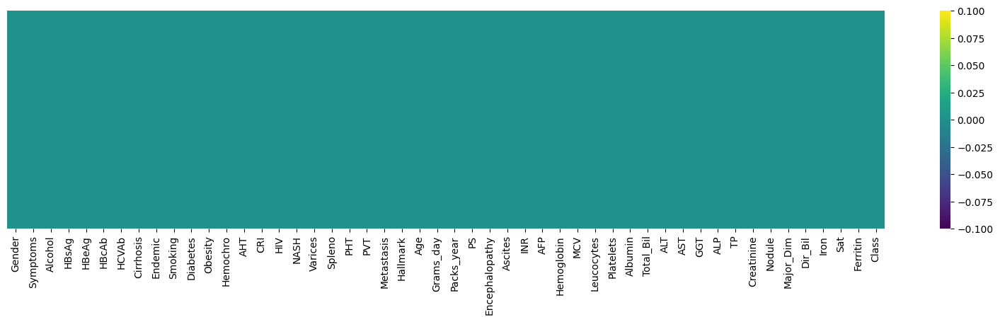

In [13]:
# plot the line plot to show the missing values
plt.figure(figsize=(20,4))
sns.heatmap(df_HCC.isnull(),yticklabels=False,cbar=True,cmap='viridis')
plt.show()

C:\Users\085\AppData\Local\Temp\ipykernel_1940\3807781527.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(15,1))


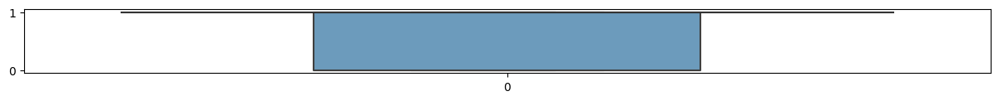

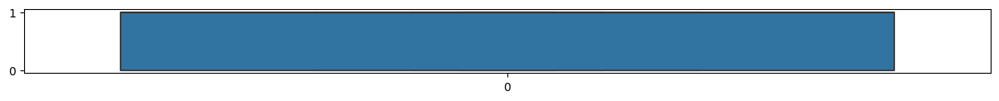

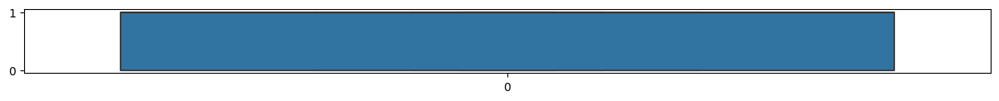

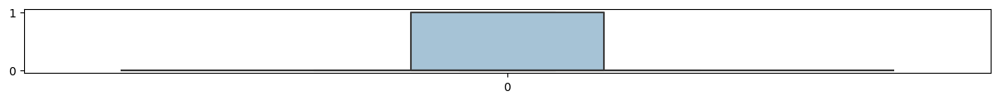

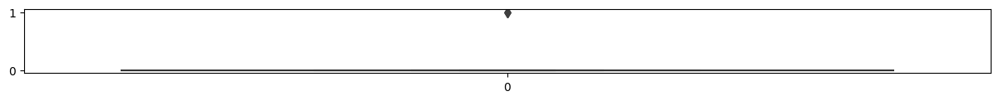

...

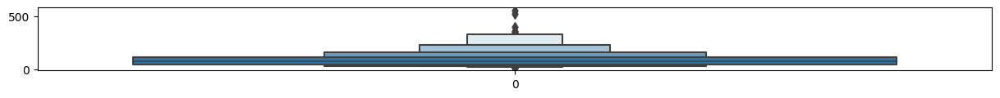

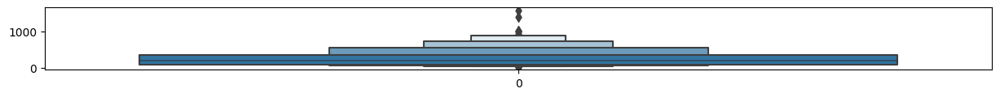

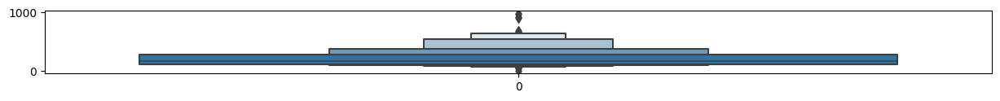

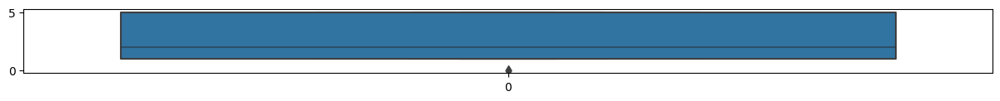

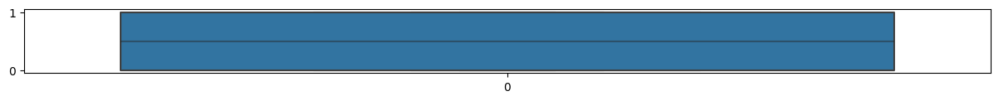

In [14]:
for i in df_HCC.select_dtypes(include='int64'):
    plt.figure(figsize=(15,1))
    sns.boxenplot(df_HCC[i])

In [15]:
# Q1 = df_HCC.quantile(0.25)
# Q3 = df_HCC.quantile(0.75)

# # Calculate the Interquartile Range (IQR)
# IQR = Q3 - Q1

# # Define the lower and upper bounds
# lower_bound = Q1 - 1.5 * IQR
# upper_bound = Q3 + 1.5 * IQR

# # Filter the data to remove outliers
# df_HCC_no_outliers = df_HCC[(df_HCC >= lower_bound) & (df_HCC <= upper_bound)]

# # Display the data without outliers
# print(df_HCC_no_outliers)

<Axes: xlabel='Age', ylabel='count'>

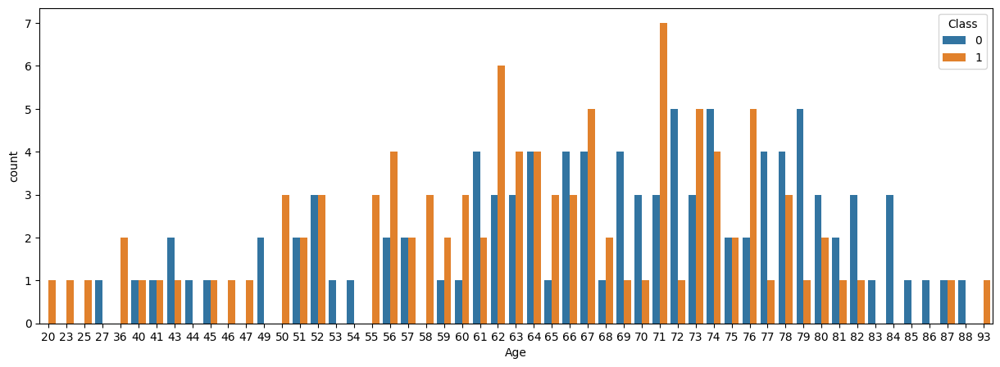

In [16]:
# plot the comparison plot for age and target columns
plt.figure(figsize=(15,5))
sns.countplot(x='Age',hue='Class',data=df_HCC)

In [17]:
import pandas as pd
from ydata_profiling import ProfileReport


# Create a profile report
profile = ProfileReport(df_HCC, title="Pandas Profiling Report", explorative=True)


In [18]:
profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [19]:
for col in df_HCC.columns:
    if df_HCC[col].dtype == 'object':  # Check for object types
        df_HCC[col] = pd.to_numeric(df_HCC[col].str.replace(',', '.'), errors='coerce')


## Data splitting

In [20]:
x = df_HCC.drop(columns=['Class'])
y = df_HCC['Class']

In [21]:
y

0      1
1      1
2      1
3      0
4      1
      ..
199    0
200    0
201    0
202    0
203    0
Name: Class, Length: 204, dtype: int64

In [22]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=1)

In [23]:
x_train

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,GGT,ALP,TP,Creatinine,Nodule,Major_Dim,Dir_Bil,Iron,Sat,Ferritin
153,1,1,1,0,0,0,0,1,0,0,...,468,338,7.0,1.13,1,15.0,1.30,94.0,37.0,48.0
180,0,1,0,0,0,0,0,1,0,0,...,234,340,6.4,0.72,3,9.4,0.69,75.5,27.0,167.0
47,1,1,1,0,0,0,0,1,0,0,...,795,595,7.2,0.79,1,2.3,4.10,63.0,34.0,888.0
151,0,0,1,0,0,0,0,1,0,0,...,126,85,7.6,0.80,1,7.0,0.40,25.0,13.0,60.0
189,1,0,1,0,0,0,0,1,0,1,...,198,239,6.2,0.94,2,2.1,2.66,118.0,83.0,748.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
133,0,1,0,0,0,0,0,0,0,0,...,739,587,7.2,2.14,5,16.0,0.10,14.0,5.0,149.0
137,0,1,0,0,0,0,0,0,0,0,...,82,141,7.2,0.85,1,9.5,0.40,91.0,31.0,80.0
72,1,1,1,0,0,0,0,1,0,1,...,177,1,6.7,1.50,5,4.0,0.80,26.0,15.0,227.0
140,0,1,0,0,0,0,0,1,0,0,...,229,302,7.0,0.60,5,9.0,0.20,91.0,31.0,206.0


In [24]:
y_train

153    0
180    0
47     0
151    1
189    0
      ..
133    0
137    1
72     1
140    0
37     0
Name: Class, Length: 163, dtype: int64

## Model Training

In [25]:
lr=LogisticRegression()
rf = RandomForestClassifier()
dtc = DecisionTreeClassifier()
rf,lr,dtc

(RandomForestClassifier(), LogisticRegression(), DecisionTreeClassifier())

In [26]:
lr.fit(x_train,y_train)
rf.fit(x_train,y_train)
dtc.fit(x_train,y_train)

C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


DecisionTreeClassifier()

In [27]:
lr_pred=lr.predict(x_test)
rf_pred=rf.predict(x_test)
dtc_pred=dtc.predict(x_test)

In [28]:
lr_pred


array([1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1,
       0, 0, 1, 0, 0, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1],
      dtype=int64)

## Logistic Metrics

In [29]:
from sklearn.metrics import confusion_matrix, accuracy_score
lr_acc = accuracy_score(y_test, lr_pred)
print("accuracy",lr_acc)

recalll_lr = recall_score(y_test, lr_pred)
print(f'recall_score: {recalll_lr}')
print('='*50)
f1_score_lr = f1_score(y_test, lr_pred)
print(f'f1_score: {f1_score_lr}')
print('='*50)

precision_scorelr =precision_score(y_test, lr_pred)
print(f'precision_score: {precision_scorelr}')
print('='*50)

# printing the classification report of the model
print(f'Here is the classification report of the model \n \n {classification_report(y_test,lr_pred)}')
print('='*50)

# printig the confusion matrix 
print(f'Here is the confusion matrix of the model \n \n {confusion_matrix(y_test,lr_pred)}')

accuracy 0.7560975609756098
recall_score: 0.75
f1_score: 0.75
precision_score: 0.75
Here is the classification report of the model 
 
               precision    recall  f1-score   support

           0       0.76      0.76      0.76        21
           1       0.75      0.75      0.75        20

    accuracy                           0.76        41
   macro avg       0.76      0.76      0.76        41
weighted avg       0.76      0.76      0.76        41

Here is the confusion matrix of the model 
 
 [[16  5]
 [ 5 15]]


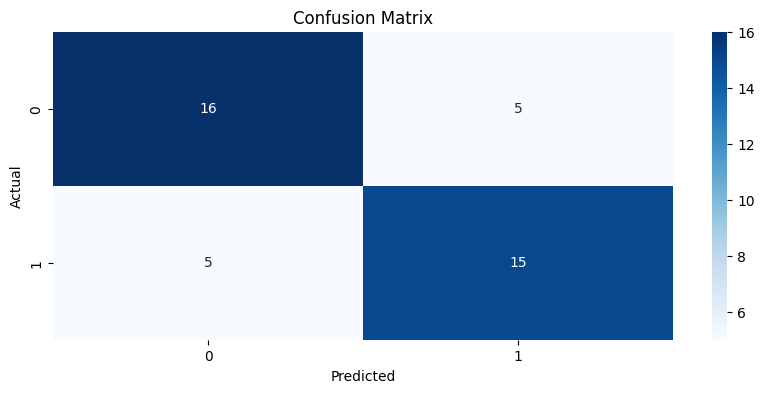

In [30]:
# Visualize the confusion matrix
plt.figure(figsize=(10,4))
sns.heatmap(confusion_matrix(y_test,lr_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### Training Set

In [31]:
lr_pred_t=lr.predict(x_train)

# Calculate and print metrics for the training set
rf_train_accuracy = accuracy_score(y_train, lr_pred_t)
rf_train_f1 = f1_score(y_train, lr_pred_t, average='weighted')
rf_train_precision = precision_score(y_train, lr_pred_t, average='weighted')
rf_train_recall = recall_score(y_train, lr_pred_t, average='weighted')

print("Training Set Metrics:")
print(f"Accuracy: {rf_train_accuracy}")
print(f"F1 Score: {rf_train_f1}")
print(f"Precision: {rf_train_precision}")
print(f"Recall: {rf_train_recall}")
print("\nTraining Set Classification Report:")
print(classification_report(y_train, lr_pred_t))


Training Set Metrics:
Accuracy: 0.7177914110429447
F1 Score: 0.717344474363601
Precision: 0.718851087562744
Recall: 0.7177914110429447

Training Set Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.68      0.71        81
           1       0.70      0.76      0.73        82

    accuracy                           0.72       163
   macro avg       0.72      0.72      0.72       163
weighted avg       0.72      0.72      0.72       163



### Randomf forest Metrcs

In [32]:
from sklearn.metrics import confusion_matrix, accuracy_score

rf_acc = accuracy_score(y_test, rf_pred)
print( "accuracy",rf_acc)


recalll_rf = recall_score(y_test, rf_pred)
print(f'recall_score: {recalll_rf}')
print('='*50)
f1_score_rf = f1_score(y_test, rf_pred)
print(f'f1_score: {f1_score_rf}')
print('='*50)

precision_scorerf =precision_score(y_test, rf_pred)
print(f'precision_score: {precision_scorerf}')
print('='*50)

# printing the classification report of the model
print(f'Here is the classification report of the model \n \n {classification_report(y_test,rf_pred)}')
print('='*50)

# printig the confusion matrix 
print(f'Here is the confusion matrix of the model \n \n {confusion_matrix(y_test,rf_pred)}')

accuracy 0.9024390243902439
recall_score: 0.9
f1_score: 0.9
precision_score: 0.9
Here is the classification report of the model 
 
               precision    recall  f1-score   support

           0       0.90      0.90      0.90        21
           1       0.90      0.90      0.90        20

    accuracy                           0.90        41
   macro avg       0.90      0.90      0.90        41
weighted avg       0.90      0.90      0.90        41

Here is the confusion matrix of the model 
 
 [[19  2]
 [ 2 18]]


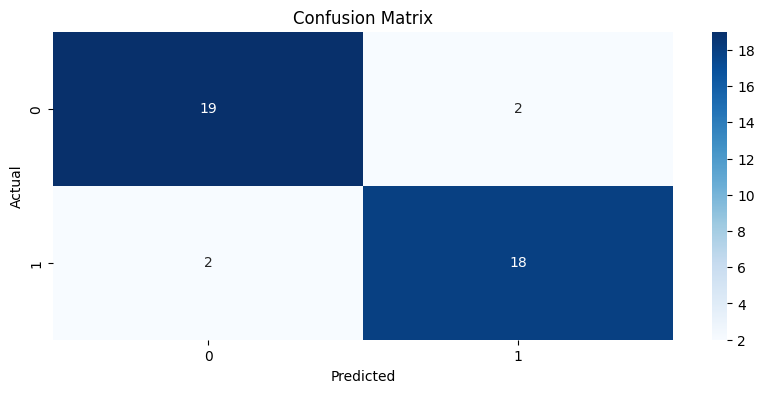

In [33]:
# Visualize the confusion matrix
plt.figure(figsize=(10,4))
sns.heatmap(confusion_matrix(y_test,rf_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### traning set

In [34]:
rf_pred_t=rf.predict(x_train)
# Calculate and print metrics for the training set
rf_train_accuracy = accuracy_score(y_train, rf_pred_t)
rf_train_f1 = f1_score(y_train, rf_pred_t, average='weighted')
rf_train_precision = precision_score(y_train, rf_pred_t, average='weighted')
rf_train_recall = recall_score(y_train, rf_pred_t, average='weighted')

print("Training Set Metrics:")
print(f"Accuracy: {rf_train_accuracy}")
print(f"F1 Score: {rf_train_f1}")
print(f"Precision: {rf_train_precision}")
print(f"Recall: {rf_train_recall}")
print("\nTraining Set Classification Report:")
print(classification_report(y_train, rf_pred_t))


Training Set Metrics:
Accuracy: 1.0
F1 Score: 1.0
Precision: 1.0
Recall: 1.0

Training Set Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        81
           1       1.00      1.00      1.00        82

    accuracy                           1.00       163
   macro avg       1.00      1.00      1.00       163
weighted avg       1.00      1.00      1.00       163



## Hyper Perameter tuning

In [35]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report
import numpy as np

# Define the parameter grid for RandomizedSearchCV
param_dist = {
    'n_estimators': np.arange(100, 1000, 100),  # Number of trees in the forest
    'max_features': ['auto', 'sqrt', 'log2'],   # Number of features to consider at every split
    'max_depth': [None] + list(np.arange(10, 110, 10)),  # Maximum depth of the tree
    'min_samples_split': np.arange(2, 11, 2),  # Minimum number of samples required to split an internal node
    'min_samples_leaf': np.arange(1, 11, 2),   # Minimum number of samples required to be at a leaf node
    'bootstrap': [True, False]  # Method for sampling data points (with or without replacement)
}

# Create a Random Forest Classifier model
rf = RandomForestClassifier(random_state=42)

# Perform RandomizedSearchCV with cross-validation
random_search = RandomizedSearchCV(
    estimator=rf, 
    param_distributions=param_dist, 
    n_iter=100,  # Number of parameter settings sampled
    scoring='accuracy',  # Scoring metric
    cv=5,  # 5-fold cross-validation
    verbose=2, 
    random_state=42, 
    n_jobs=-1  # Use all available cores
)

# Fit the random search model
random_search.fit(x_train, y_train)

# Get the best parameters and the best score
print("Best Hyperparameters:", random_search.best_params_)
print("Best Score:", random_search.best_score_)

# Predict on the test data
y_pred_t = random_search.best_estimator_.predict(x_train)

# Evaluate the model
print(classification_report(y_train, y_pred_t))


Fitting 5 folds for each of 100 candidates, totalling 500 fits


C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
195 fits failed out of a total of 500.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
195 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 1466, in wrapper
    estimator._validate_params()
  File "C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 666, in _validate_params
    validate_par

Best Hyperparameters: {'n_estimators': 200, 'min_samples_split': 2, 'min_samples_leaf': 7, 'max_features': 'log2', 'max_depth': 70, 'bootstrap': True}
Best Score: 0.8214015151515153
              precision    recall  f1-score   support

           0       0.92      0.94      0.93        81
           1       0.94      0.91      0.93        82

    accuracy                           0.93       163
   macro avg       0.93      0.93      0.93       163
weighted avg       0.93      0.93      0.93       163



### Decison tree metrics

In [36]:
from sklearn.metrics import confusion_matrix, accuracy_score
dtc_cm = confusion_matrix(y_test, dtc_pred)
print(dtc_cm)

dtc_acc =accuracy_score(y_test, dtc_pred)
print("accuracy",dtc_acc)


recalll_dtc = recall_score(y_test, dtc_pred)
print(f'recall_score: {recalll_dtc}')
print('='*50)
f1_score_dtc = f1_score(y_test, dtc_pred)
print(f'f1_score: {f1_score_dtc}')
print('='*50)

precision_scoredtc =precision_score(y_test, dtc_pred)
print(f'precision_score: {precision_scoredtc}')
print('='*50)

# printing the classification report of the model
print(f'Here is the classification report of the model \n \n {classification_report(y_test,dtc_pred)}')




[[16  5]
 [ 7 13]]
accuracy 0.7073170731707317
recall_score: 0.65
f1_score: 0.6842105263157895
precision_score: 0.7222222222222222
Here is the classification report of the model 
 
               precision    recall  f1-score   support

           0       0.70      0.76      0.73        21
           1       0.72      0.65      0.68        20

    accuracy                           0.71        41
   macro avg       0.71      0.71      0.71        41
weighted avg       0.71      0.71      0.71        41



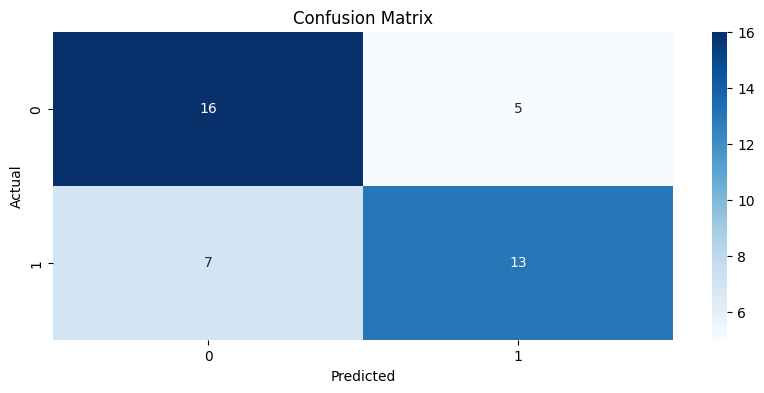

In [37]:
# Visualize the confusion matrix
plt.figure(figsize=(10,4))
sns.heatmap(confusion_matrix(y_test,dtc_pred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

### Training Set

In [38]:
dtc_pred_t=dtc.predict(x_train)

# Calculate and print metrics for the training set
dtc_train_accuracy = accuracy_score(y_train, dtc_pred_t)
dtc_train_f1 = f1_score(y_train, dtc_pred_t)
dtc_train_precision = precision_score(y_train, dtc_pred_t)
dtc_train_recall = recall_score(y_train, dtc_pred_t)

print("Training Set Metrics:")
print(f"Accuracy: {dtc_train_accuracy}")
print(f"F1 Score: {dtc_train_f1}")
print(f"Precision: {dtc_train_precision}")
print(f"Recall: {dtc_train_recall}")
print("\nTraining Set Classification Report:")
print(classification_report(y_train, dtc_pred_t))


Training Set Metrics:
Accuracy: 1.0
F1 Score: 1.0
Precision: 1.0
Recall: 1.0

Training Set Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00        81
           1       1.00      1.00      1.00        82

    accuracy                           1.00       163
   macro avg       1.00      1.00      1.00       163
weighted avg       1.00      1.00      1.00       163



## Hyper Perameter tuning

In [39]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
import numpy as np

# Define the parameter grid for RandomizedSearchCV specific to Decision Tree Classifier
param_dist = {
    'max_depth': [None] + list(np.arange(10, 110, 10)),  # Maximum depth of the tree
    'min_samples_split': np.arange(2, 20, 2),  # Minimum number of samples required to split an internal node
    'min_samples_leaf': np.arange(1, 20, 2),   # Minimum number of samples required to be at a leaf node
    'criterion': ['gini', 'entropy'],  # The function to measure the quality of a split
    'splitter': ['best', 'random'],  # Strategy used to split at each node
    'max_features': [None, 'sqrt', 'log2'],  # Number of features to consider when looking for the best split
}

# Create a Decision Tree Classifier model
dt = DecisionTreeClassifier(random_state=42)

# Perform RandomizedSearchCV with cross-validation
random_search = RandomizedSearchCV(
    estimator=dt, 
    param_distributions=param_dist, 
    n_iter=100,  # Number of parameter settings sampled
    scoring='accuracy',  # Scoring metric
    cv=5,  # 5-fold cross-validation
    verbose=2, 
    random_state=42, 
    n_jobs=-1  # Use all available cores
)

# Fit the random search model
random_search.fit(x_train, y_train)

# Get the best parameters and the best score
print("Best Hyperparameters:", random_search.best_params_)
print("Best Cross-Validation Score:", random_search.best_score_)

# Predict on the test data
y_pred = random_search.best_estimator_.predict(x_test)


accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy:.4f}")


print("\nClassification Report:\n")
print(classification_report(y_test, y_pred))


print("\nConfusion Matrix:\n")
print(confusion_matrix(y_test, y_pred))


Fitting 5 folds for each of 100 candidates, totalling 500 fits
Best Hyperparameters: {'splitter': 'best', 'min_samples_split': 18, 'min_samples_leaf': 19, 'max_features': None, 'max_depth': 100, 'criterion': 'gini'}
Best Cross-Validation Score: 0.7178030303030303
Accuracy: 0.7317

Classification Report:

              precision    recall  f1-score   support

           0       0.69      0.86      0.77        21
           1       0.80      0.60      0.69        20

    accuracy                           0.73        41
   macro avg       0.75      0.73      0.73        41
weighted avg       0.74      0.73      0.73        41


Confusion Matrix:

[[18  3]
 [ 8 12]]


## StackingClassifier

In [40]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix,recall_score,f1_score,precision_score
# model building 
base_classifiers = [
    ('RF', RandomForestClassifier()),
    ('DTC', DecisionTreeClassifier())
]
final_estimator = LogisticRegression()

stacking_clf = StackingClassifier(
    estimators=base_classifiers,
    final_estimator=final_estimator,
    cv=5
)
#here we fit the the to algoritham
stacking_clf.fit(x_train,y_train)

#prediction of stacking classifier
stack_ypred=stacking_clf.predict(x_test)

# importing the metrics for the evaluation of the model

stack_acc = accuracy_score(y_test, stack_ypred)
print(f'Accuracy: {stack_acc}')
print('='*50)

recalll_stck = recall_score(y_test, stack_ypred)
print(f'recall_score: {recalll_stck}')
print('='*50)
f1_score_stck = f1_score(y_test, stack_ypred)
print(f'f1_score: {f1_score_stck}')
print('='*50)

precision_scorestck =precision_score(y_test, stack_ypred)
print(f'precision_score: {precision_scorestck}')
print('='*50)

# printing the classification report of the model
print(f'Here is the classification report of the model \n \n {classification_report(y_test,stack_ypred)}')
print('='*50)

# printig the confusion matrix 
print(f'Here is the confusion matrix of the model \n \n {confusion_matrix(y_test,stack_ypred)}')



Accuracy: 0.9024390243902439
recall_score: 0.9
f1_score: 0.9
precision_score: 0.9
Here is the classification report of the model 
 
               precision    recall  f1-score   support

           0       0.90      0.90      0.90        21
           1       0.90      0.90      0.90        20

    accuracy                           0.90        41
   macro avg       0.90      0.90      0.90        41
weighted avg       0.90      0.90      0.90        41

Here is the confusion matrix of the model 
 
 [[19  2]
 [ 2 18]]


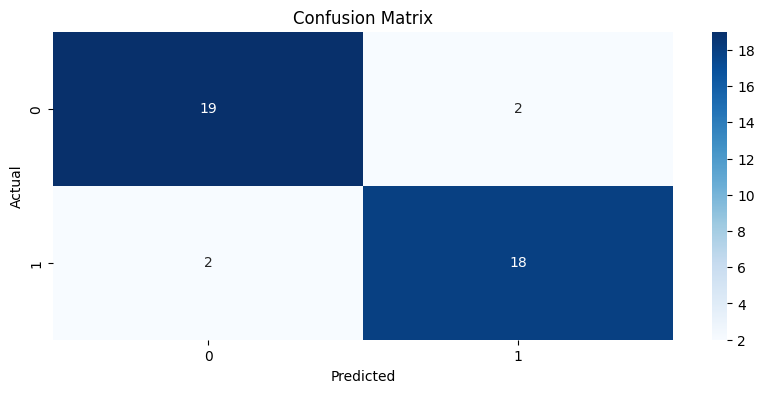

In [41]:
# Visualize the confusion matrix
plt.figure(figsize=(10,4))
sns.heatmap(confusion_matrix(y_test,stack_ypred), annot=True, fmt='d', cmap='Blues')
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

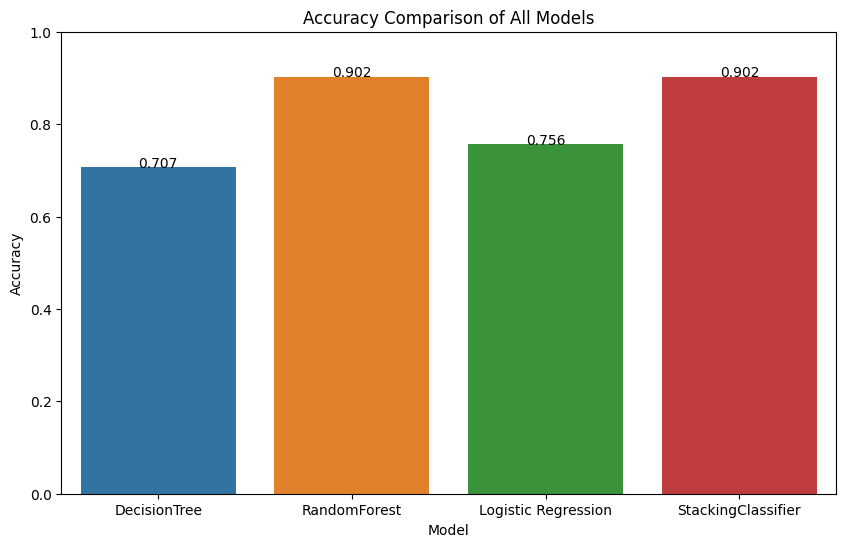

In [42]:

model_names = ['DecisionTree', 'RandomForest', 'Logistic Regression','StackingClassifier']
accuracies = [dtc_acc, rf_acc ,lr_acc,stack_acc]

plt.figure(figsize=(10, 6))
sns.barplot(x=model_names, y=accuracies)
plt.xlabel('Model')
plt.ylabel('Accuracy')
plt.title('Accuracy Comparison of All Models')
plt.ylim(0,1)
for i in range(len(accuracies)):
    plt.text(i, accuracies[i], f'{accuracies[i]:.3f}', ha='center')
plt.show()


C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


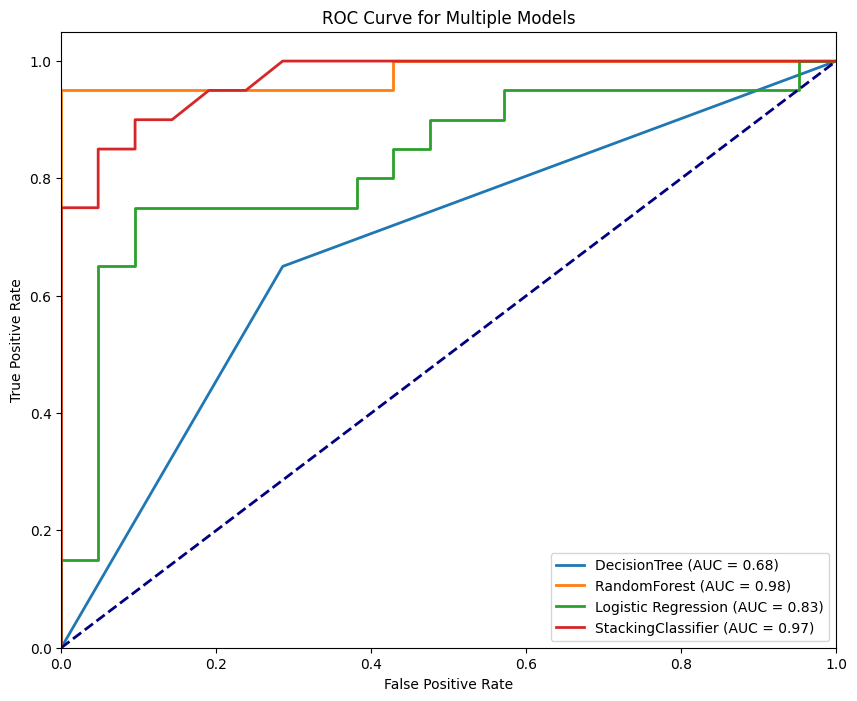

In [43]:
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc

# Fit the models on the training data
dtc.fit(x_train, y_train)  # Decision Tree
rf.fit(x_train, y_train)   # Random Forest
lr.fit(x_train, y_train)   # Logistic Regression
stacking_clf.fit(x_train, y_train)  # Stacking Classifier

y_pred_proba = {
    'DecisionTree': dtc.predict_proba(x_test),
    'RandomForest': rf.predict_proba(x_test),
    'Logistic Regression': lr.predict_proba(x_test),
    'StackingClassifier': stacking_clf.predict_proba(x_test)
}

plt.figure(figsize=(10, 8))

for model_name, proba in y_pred_proba.items():
    fpr, tpr, _ = roc_curve(y_test, proba[:, 1])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'{model_name} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve for Multiple Models')
plt.legend(loc='lower right')
plt.show()


In [44]:
import joblib
joblib.dump(rf,'random_forest.joblib')

['random_forest.joblib']

In [45]:
joblib.dump(lr,'random_forest.joblib')

['random_forest.joblib']

In [46]:
joblib.dump(dtc,'decision.joblib')


['decision.joblib']

In [47]:
joblib.dump(stacking_clf,'stck.joblib')

['stck.joblib']

In [48]:
columns = ['Age', 'Diabetes', 'Obesity', 'Smoking', 'Symptoms', 'Encephalopathy','Alcohol',
       'Iron', 'Platelets', 'Hemoglobin','Gender','Ascites']


# Select all columns except target
X = df_HCC[columns]
# Select the target variable 'target
Y = df_HCC['Class']


In [49]:

xtrain, xtest, ytrain, ytest = train_test_split(X, Y, test_size=0.3, random_state=42)

In [50]:
def convert_to_float(element):
    if isinstance(element, str):
        element = element.replace(',', '.')
    return float(element)


vectorized_convert = np.vectorize(convert_to_float)

xtrain = vectorized_convert(xtrain)
xtest = vectorized_convert(xtest)
xtrain

array([[73. ,  0. ,  0. , ..., 13.1,  1. ,  1. ],
       [62. ,  1. ,  0. , ..., 12.2,  1. ,  1. ],
       [66. ,  1. ,  0. , ..., 13.3,  1. ,  1. ],
       ...,
       [79. ,  1. ,  0. , ..., 11.5,  1. ,  1. ],
       [54. ,  0. ,  0. , ..., 12.6,  0. ,  1. ],
       [64. ,  0. ,  0. , ..., 13.9,  1. ,  2. ]])

In [51]:


from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

# Define base classifiers
base_classifiers = [
    ('rf', RandomForestClassifier(n_estimators=50, random_state=42)),
    ('gb', GradientBoostingClassifier(n_estimators=50, random_state=42)),
    ('knn', KNeighborsClassifier())
]

# Define meta-classifier
meta_classifier = LogisticRegression()

# Create and train stacking classifier
stacking_clf2 = StackingClassifier(estimators=base_classifiers, final_estimator=meta_classifier)
stacking_clf2.fit(xtrain,ytrain)

stacking_pred =stacking_clf2.predict(xtest)



# importing the metrics for the evaluation of the model
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, roc_auc_score, roc_curve,f1_score,precision_score,recall_score
# printing the accuracy score of the model
stack_test_ccuracy = accuracy_score(ytest, stacking_pred)
print(f'Accuracy: {stack_test_ccuracy}')

Accuracy: 0.6935483870967742


In [52]:
## Labrires for Metresis
from sklearn.metrics import accuracy_score,f1_score,precision_score,recall_score,confusion_matrix,classification_report
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()
#fitting to the model
lr.fit(xtrain,ytrain)
#predicton
lr_pred = lr.predict(xtest)
#accuracy score 
lr_acc = accuracy_score(ytest,lr_pred)
print("Accuracy Score of Logistic = ",lr_acc)
print('====================================================')
#finding the f1 score
lr_f1 = f1_score(ytest,lr_pred,average='macro')
print("f1 score score fo Logistic =",lr_f1)
print('====================================================')
#precision_score
lr_pre = precision_score(ytest,lr_pred,average='macro')
print('precision_score of Logistic is=',lr_pre)
print('====================================================')
#recall_score
lr_rec = recall_score(ytest,lr_pred,average='macro')
print('recall_score of Logistic is =',lr_rec)
print('===================================================')
#confusion matrix
lr_cm = confusion_matrix(ytest, lr_pred) 
print('coonfusion matrxi of Logistic =\n',lr_cm)
print('===================================================')


Accuracy Score of Logistic =  0.6451612903225806
f1 score score fo Logistic = 0.6356837606837606
precision_score of Logistic is= 0.6356837606837606
recall_score of Logistic is = 0.6356837606837606
coonfusion matrxi of Logistic =
 [[25 11]
 [11 15]]


C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [53]:
#import Libraries
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix,accuracy_score,f1_score,precision_score,recall_score
rf = RandomForestClassifier()
rf.fit(xtrain,ytrain)
#prediction
rf_pred = rf.predict(xtest)
#accuracy score
rf_acc = accuracy_score(ytest,rf_pred)
print("Accuracy Score of RandomForest= ",rf_acc)
print('====================================================')
#finding the f1 score
rf_f1 = f1_score(ytest,rf_pred)
print("f1 score score fo RandomForest =",rf_f1)
print('====================================================')
rf_pre = precision_score(ytest,rf_pred)
print('precision_score of RandomForest is=',rf_pre)
print('====================================================')
#recall_score
rf_rec = recall_score(ytest,rf_pred)
print('recall_score of RandomForest is =',rf_rec)
print('===================================================')
#confusion matrix
rf_cm = confusion_matrix(ytest, rf_pred) 
print('coonfusion matrxi of RandomForest =\n',rf_cm)
print('===================================================')
from sklearn.metrics import classification_report
rf_cr = classification_report(ytest, rf_pred) 
print('cclassification_report of RandomForest =\n',rf_cr)
print('===================================================')


Accuracy Score of RandomForest=  0.6290322580645161
f1 score score fo RandomForest = 0.5306122448979592
precision_score of RandomForest is= 0.5652173913043478
recall_score of RandomForest is = 0.5
coonfusion matrxi of RandomForest =
 [[26 10]
 [13 13]]
cclassification_report of RandomForest =
               precision    recall  f1-score   support

           0       0.67      0.72      0.69        36
           1       0.57      0.50      0.53        26

    accuracy                           0.63        62
   macro avg       0.62      0.61      0.61        62
weighted avg       0.62      0.63      0.63        62



## K Best

In [54]:
x.head()

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,GGT,ALP,TP,Creatinine,Nodule,Major_Dim,Dir_Bil,Iron,Sat,Ferritin
0,1,0,1,0,0,0,0,1,0,1,...,183,150,7.1,0.70,1,3.5,0.50,52.5,37.0,856.0
1,0,0,0,0,0,0,1,1,0,1,...,77,120,7.0,0.58,1,1.8,0.85,32.0,10.0,18.0
2,1,0,1,1,0,1,0,1,0,1,...,202,109,7.0,2.10,5,13.0,0.10,28.0,6.0,16.0
3,1,1,1,0,0,0,0,1,0,1,...,94,174,8.1,1.11,2,15.7,0.20,131.0,78.0,1316.0
4,1,1,1,1,0,1,0,1,0,1,...,173,109,6.9,1.80,1,9.0,0.10,59.0,15.0,22.0


In [55]:
y.head()

0    1
1    1
2    1
3    0
4    1
Name: Class, dtype: int64

### Uisng K-Best 

In [56]:
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,random_state=42, stratify=y)

In [57]:
def convert_to_float(element):
    if isinstance(element, str):
        element = element.replace(',', '.')
    return float(element)

# Apply the function element-wise using pandas applymap
xtrain = df_HCC.applymap(convert_to_float)


In [58]:
xtrain.head()

,Gender,Symptoms,Alcohol,HBsAg,HBeAg,HBcAb,HCVAb,Cirrhosis,Endemic,Smoking,...,ALP,TP,Creatinine,Nodule,Major_Dim,Dir_Bil,Iron,Sat,Ferritin,Class
0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,150.0,7.1,0.70,1.0,3.5,0.50,52.5,37.0,856.0,1.0
1,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,...,120.0,7.0,0.58,1.0,1.8,0.85,32.0,10.0,18.0,1.0
2,1.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,109.0,7.0,2.10,5.0,13.0,0.10,28.0,6.0,16.0,1.0
3,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,174.0,8.1,1.11,2.0,15.7,0.20,131.0,78.0,1316.0,0.0
4,1.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,0.0,1.0,...,109.0,6.9,1.80,1.0,9.0,0.10,59.0,15.0,22.0,1.0


In [59]:
from sklearn.feature_selection import mutual_info_classif
# determine the mutual information
mutual_info = mutual_info_classif(x_train, y_train,random_state=0)
mutual_info

array([0.        , 0.0312297 , 0.        , 0.        , 0.        ,
       0.01782627, 0.        , 0.        , 0.01469919, 0.        ,
       0.        , 0.        , 0.        , 0.03797671, 0.00677488,
       0.03212394, 0.        , 0.00753268, 0.        , 0.03658403,
       0.05143464, 0.00642675, 0.00748365, 0.01607155, 0.05760617,
       0.03056476, 0.03056677, 0.        , 0.        , 0.02389266,
       0.145452  , 0.08253296, 0.08669478, 0.02684715, 0.05712605,
       0.12376508, 0.        , 0.        , 0.07379013, 0.01404692,
       0.11798775, 0.        , 0.        , 0.        , 0.03588276,
       0.02987237, 0.14777673, 0.04665253, 0.07659649])

In [60]:
type(x_train)

pandas.core.frame.DataFrame

In [61]:
df_HCC.columns

Index(['Gender', 'Symptoms', 'Alcohol', 'HBsAg', 'HBeAg', 'HBcAb', 'HCVAb',
       'Cirrhosis', 'Endemic', 'Smoking', 'Diabetes', 'Obesity', 'Hemochro',
       'AHT', 'CRI', 'HIV', 'NASH', 'Varices', 'Spleno', 'PHT', 'PVT',
       'Metastasis', 'Hallmark', 'Age', 'Grams_day', 'Packs_year', 'PS',
       'Encephalopathy', 'Ascites', 'INR', 'AFP', 'Hemoglobin', 'MCV',
       'Leucocytes', 'Platelets', 'Albumin', 'Total_Bil', 'ALT', 'AST', 'GGT',
       'ALP', 'TP', 'Creatinine', 'Nodule', 'Major_Dim', 'Dir_Bil', 'Iron',
       'Sat', 'Ferritin', 'Class'],
      dtype='object')

In [62]:
mutual_info = pd.Series(mutual_info)
mutual_info.index = x_train.columns
mutual_info.sort_values(ascending=False)
mutual_info

Gender            0.000000
Symptoms          0.031230
Alcohol           0.000000
HBsAg             0.000000
HBeAg             0.000000
HBcAb             0.017826
HCVAb             0.000000
Cirrhosis         0.000000
Endemic           0.014699
Smoking           0.000000
Diabetes          0.000000
Obesity           0.000000
Hemochro          0.000000
AHT               0.037977
CRI               0.006775
HIV               0.032124
NASH              0.000000
Varices           0.007533
Spleno            0.000000
PHT               0.036584
PVT               0.051435
Metastasis        0.006427
Hallmark          0.007484
Age               0.016072
Grams_day         0.057606
Packs_year        0.030565
PS                0.030567
Encephalopathy    0.000000
Ascites           0.000000
INR               0.023893
AFP               0.145452
Hemoglobin        0.082533
MCV               0.086695
Leucocytes        0.026847
Platelets         0.057126
Albumin           0.123765
Total_Bil         0.000000
A

<Axes: >

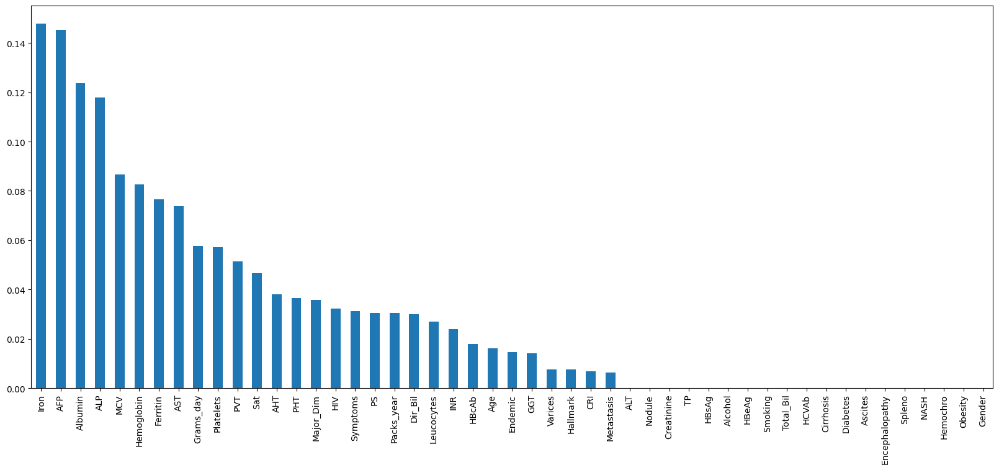

In [63]:
#let's plot the ordered mutual_info values per feature
mutual_info.sort_values(ascending=False).plot.bar(figsize=(20, 8))

In [64]:
#import the libraries
from sklearn.feature_selection import SelectKBest
#No we Will select the  top 8 important features
sel_eight_cols = SelectKBest(mutual_info_classif, k=10)
sel_eight_cols.fit(x_train, y_train)
col = x_train.columns[sel_eight_cols.get_support()]

In [65]:
col

Index(['Symptoms', 'HBsAg', 'AFP', 'Hemoglobin', 'MCV', 'Albumin', 'AST',
       'ALP', 'Iron', 'Ferritin'],
      dtype='object')

In [66]:
x_train = x_train[['Gender', 'Smoking', 'AFP', 'Hemoglobin', 'MCV', 'Albumin', 'AST',
       'ALP', 'Iron', 'Ferritin']]

In [67]:
x_test = x_test[['Gender', 'Smoking', 'AFP', 'Hemoglobin', 'MCV', 'Albumin', 'AST',
       'ALP', 'Iron', 'Ferritin']]

## After K-Best StackingClassifier

In [68]:
from sklearn.ensemble import StackingClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression

# Define base classifiers
base_classifiers = [
    ('rf', RandomForestClassifier(n_estimators=50, random_state=42)),
    ('gb', GradientBoostingClassifier(n_estimators=50, random_state=42)),
    ('knn', KNeighborsClassifier())
]

# Define meta-classifier
meta_classifier = LogisticRegression()

# Create and train stacking classifier
stacking_clf = StackingClassifier(estimators=base_classifiers, final_estimator=meta_classifier)
stacking_clf.fit(x_train,y_train)


StackingClassifier(estimators=[('rf',
                                RandomForestClassifier(n_estimators=50,
                                                       random_state=42)),
                               ('gb',
                                GradientBoostingClassifier(n_estimators=50,
                                                           random_state=42)),
                               ('knn', KNeighborsClassifier())],
                   final_estimator=LogisticRegression())

In [69]:
stacking_pred =stacking_clf.predict(x_test)

In [70]:
# importing the metrics for the evaluation of the model
from sklearn.metrics import accuracy_score,confusion_matrix,classification_report, roc_auc_score, roc_curve,f1_score,precision_score,recall_score
# printing the accuracy score of the model
stack_test_ccuracy = accuracy_score(y_test, stacking_pred)
print(f'Accuracy: {stack_test_ccuracy}')

Accuracy: 0.8709677419354839


### After K-Best DecisionTreeClassifier

In [71]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, classification_report
# Train the Decision Tree classifier
dt_classifier1 = DecisionTreeClassifier(random_state=42)
dt_classifier1.fit(x_train, y_train)


# Predict on the training and test sets
dtc1_pred = dt_classifier1.predict(x_train)
dtc1_t_pred = dt_classifier1.predict(x_test)

# Calculate and print metrics for the test set
dtc1_test_accuracy = accuracy_score(y_test, dtc1_t_pred)
dtc1_test_f1 = f1_score(y_test, dtc1_t_pred, average='weighted')
dtc1_test_precision = precision_score(y_test, dtc1_t_pred, average='weighted')
dtc1_test_recall = recall_score(y_test, dtc1_t_pred, average='weighted')

print("\nTest Set Metrics:")
print(f"Accuracy: {dtc1_test_accuracy}")
print(f"F1 Score: {dtc1_test_f1}")
print(f"Precision: {dtc1_test_precision}")
print(f"Recall: {dtc1_test_recall}")
print("\nTest Set Classification Report:")
print(classification_report(y_test, dtc1_t_pred))



Test Set Metrics:
Accuracy: 0.8225806451612904
F1 Score: 0.8225344782721831
Precision: 0.8229166666666667
Recall: 0.8225806451612904

Test Set Classification Report:
              precision    recall  f1-score   support

           0       0.83      0.81      0.82        31
           1       0.81      0.84      0.83        31

    accuracy                           0.82        62
   macro avg       0.82      0.82      0.82        62
weighted avg       0.82      0.82      0.82        62



### After K-Best RandomForestClassifier

In [72]:
rf_k = RandomForestClassifier()
rf_k.fit(x_train, y_train)
rf_k_pred =rf_k.predict(x_test)

from sklearn.metrics import confusion_matrix, accuracy_score
rf_cm = confusion_matrix(y_test, rf_k_pred)
print(rf_cm)

rf_acc = accuracy_score(y_test, rf_k_pred)
print( "accuracy",rf_acc)


recalll_rf = recall_score(y_test, rf_k_pred)
print(f'recall_score: {recalll_rf}')
print('='*50)
f1_score_rf = f1_score(y_test, rf_k_pred)
print(f'f1_score: {f1_score_rf}')
print('='*50)

precision_scorerf =precision_score(y_test, rf_k_pred)
print(f'precision_score: {precision_scorerf}')
print('='*50)

# printing the classification report of the model
print(f'Here is the classification report of the model \n \n {classification_report(y_test,rf_k_pred)}')
print('='*50)

# printig the confusion matrix 
print(f'Here is the confusion matrix of the model \n \n {confusion_matrix(y_test,rf_k_pred)}')

[[27  4]
 [ 4 27]]
accuracy 0.8709677419354839
recall_score: 0.8709677419354839
f1_score: 0.8709677419354839
precision_score: 0.8709677419354839
Here is the classification report of the model 
 
               precision    recall  f1-score   support

           0       0.87      0.87      0.87        31
           1       0.87      0.87      0.87        31

    accuracy                           0.87        62
   macro avg       0.87      0.87      0.87        62
weighted avg       0.87      0.87      0.87        62

Here is the confusion matrix of the model 
 
 [[27  4]
 [ 4 27]]


In [73]:
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix,recall_score,f1_score,precision_score
# model building 
base_classifiers = [
    ('RF', RandomForestClassifier()),
    ('DTC', DecisionTreeClassifier())
]
final_estimator = LogisticRegression()

stacking_clf = StackingClassifier(
    estimators=base_classifiers,
    final_estimator=final_estimator,
    cv=5
)
#here we fit the the to algoritham
stacking_clf.fit(x_train,y_train)

#prediction of stacking classifier
stack_ypred=stacking_clf.predict(x_test)

# importing the metrics for the evaluation of the model

stack_acc = accuracy_score(y_test, stack_ypred)
print(f'Accuracy: {stack_acc}')
print('='*50)

recalll_stck = recall_score(y_test, stack_ypred)
print(f'recall_score: {recalll_stck}')
print('='*50)
f1_score_stck = f1_score(y_test, stack_ypred)
print(f'f1_score: {f1_score_stck}')
print('='*50)

precision_scorestck =precision_score(y_test, stack_ypred)
print(f'precision_score: {precision_scorestck}')
print('='*50)

# printing the classification report of the model
print(f'Here is the classification report of the model \n \n {classification_report(y_test,stack_ypred)}')
print('='*50)

# printig the confusion matrix 
print(f'Here is the confusion matrix of the model \n \n {confusion_matrix(y_test,stack_ypred)}')



Accuracy: 0.8548387096774194
recall_score: 0.8064516129032258
f1_score: 0.847457627118644
precision_score: 0.8928571428571429
Here is the classification report of the model 
 
               precision    recall  f1-score   support

           0       0.82      0.90      0.86        31
           1       0.89      0.81      0.85        31

    accuracy                           0.85        62
   macro avg       0.86      0.85      0.85        62
weighted avg       0.86      0.85      0.85        62

Here is the confusion matrix of the model 
 
 [[28  3]
 [ 6 25]]


In [74]:
x_test.head()

,Gender,Smoking,AFP,Hemoglobin,MCV,Albumin,AST,ALP,Iron,Ferritin
158,1,0,1713.0,8.2,94.2,3.60,59,263,9.0,490.0
49,1,1,20.0,15.0,96.7,4.60,49,109,184.0,905.0
34,1,0,5689.0,14.3,99.6,3.80,102,184,94.0,48.0
154,0,0,615.0,11.7,99.7,2.82,50,318,25.0,60.0
111,1,1,173.0,11.1,105.5,3.10,206,188,105.0,221.0


In [75]:
x_test.to_csv('xdata.csv')

In [76]:
y_test.to_csv('ydata.csv')

In [77]:
ytest.head()

15     1
9      1
115    1
78     1
66     1
Name: Class, dtype: int64

### New Values 

In [78]:
data =[0.0,77.0,12.3,104.2,3.2,38,182,4.3,93.0,307.0]
pred = rf_k.predict([data])
pred

C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([1], dtype=int64)

In [79]:
new =[1,0,975.0,15.3,103.0,3.5,85,266,180.0,1176.0]
pred1 = rf_k.predict([new])
pred1

C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([0], dtype=int64)

In [80]:
data1 =[0,0,152.0,10.9,99.6,3.2,80,106,52.5,856.0]
pred2 = rf_k.predict([data1])
pred2

C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([0], dtype=int64)

In [81]:

data2 =[0,1,8.8,14.9,94.8,4.3,180,5.4,144.0,295.0]
pred3 = rf_k.predict([data2])
pred3

C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([1], dtype=int64)

In [82]:
data4 =[1,0,1018.0,10.9,101.8,3.62,184,176,95.8,501.0]
pred4 = rf_k.predict([data4])
pred4

C:\Users\085\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py:493: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


array([0], dtype=int64)

In [83]:
joblib.dump(rf_k,'random_k.joblib')

['random_k.joblib']

In [84]:
joblib.dump(stacking_clf2,'satckmodel2.joblib')

['satckmodel2.joblib']